In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot 
import os
print(os.listdir())
import folium
from folium.plugins import MarkerCluster

['Country-Code.xlsx', 'new.ipynb', 'Zomato Analysis.ipynb', 'zomato.csv']


In [2]:
zomato=pd.read_csv("zomato.csv", encoding='latin-1')
Country=pd.read_excel("Country-Code.xlsx")

In [3]:
df=pd.merge(zomato, Country, on='Country Code', how='left')

In [4]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines


In [5]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [7]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [8]:
df.shape

(9551, 22)

In [9]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

##### We have only 9 missing values in the 'Cuisines' column, which is very small compared to the size of our dataset, which contains 9,551 rows.

In [10]:
df['Cuisines'].unique()

array(['French, Japanese, Desserts', 'Japanese',
       'Seafood, Asian, Filipino, Indian', ..., 'Burger, Izgara',
       'World Cuisine, Patisserie, Cafe', 'Italian, World Cuisine'],
      dtype=object)

In [11]:
df['Cuisines'].mode()

0    North Indian
Name: Cuisines, dtype: object

In [12]:
df[df['Cuisines']=='North Indian']

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
626,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,...,No,No,No,No,2,3.6,Yellow,Good,94,India
680,2400052,Eat On,1,Allahabad,"Palace Compound, Near Palace Cinema, MG Marg, ...",Civil Lines,"Civil Lines, Allahabad",81.834236,25.450377,North Indian,...,No,No,No,No,1,3.7,Yellow,Good,105,India
686,2200078,Charming Chicken,1,Amritsar,"Shop 3, Opposite Nari Nikaten, Majithia Road, ...",Basant Nagar,"Basant Nagar, Amritsar",74.884384,31.644532,North Indian,...,No,No,No,No,1,3.9,Yellow,Good,151,India
690,2200067,Bubby Fish & Chicken Corner,1,Amritsar,"Near Crystal Chowk, Cooper Road, INA Colony, A...",INA Colony,"INA Colony, Amritsar",74.875828,31.635671,North Indian,...,No,No,No,No,1,3.5,Yellow,Good,91,India
699,2200132,Brothers Dhaba,1,Amritsar,"Golden Temple Out Road, Opposite Amritsar Muni...",Town Hall,"Town Hall, Amritsar",74.877666,31.625981,North Indian,...,No,No,No,No,2,3.8,Yellow,Good,276,India
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9148,18378803,#Dilliwaala6,1,Puducherry,"6, Rue De La Marine, White Town, Puducherry",White Town,"White Town, Puducherry",79.834810,11.936532,North Indian,...,No,No,No,No,3,3.7,Yellow,Good,124,India
9173,18441490,Barbeque Ville,1,Pune,"257, Green Valley, Near Mankar Chowk, Kaspate ...",Wakad,"Wakad, Pune",73.773572,18.592718,North Indian,...,Yes,No,No,No,3,4.4,Green,Very Good,208,India
9227,3200002,Gazebo Garden Restaurant,1,Vadodara,"Opposite FGI, Near Iscon Harmony, Sevasi-Bhimp...",Panchvati,"Panchvati, Vadodara",0.000000,0.000000,North Indian,...,No,No,No,No,3,3.5,Yellow,Good,82,India
9241,3900250,Baati Chokha,1,Varanasi,"Anand Mandir Cinema, Telibagh, Dashaswmedh Roa...",Dashaswmedh Road,"Dashaswmedh Road, Varanasi",0.000000,0.000000,North Indian,...,No,No,No,No,2,3.7,Yellow,Good,68,India


In [13]:
df['Cuisines'].mode()[0]

'North Indian'

In [14]:
df['Cuisines'].fillna(df['Cuisines'].mode()[0], inplace=True)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\1418112828.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





### Zomato's Presence across the Globe

In [15]:
# Grouping and counting number of restaurants per country
country_counts = df['Country'].value_counts().reset_index()
country_counts.columns = ['Country', 'Restaurant_Count']

print(country_counts)


           Country  Restaurant_Count
0            India              8652
1    United States               434
2   United Kingdom                80
3           Brazil                60
4     South Africa                60
5              UAE                60
6      New Zealand                40
7           Turkey                34
8        Australia                24
9      Phillipines                22
10       Indonesia                21
11           Qatar                20
12       Singapore                20
13       Sri Lanka                20
14          Canada                 4


In [16]:
# Base map (global centered)
world_map = folium.Map(location=[20, 0], zoom_start=2)

# Cluster markers
marker_cluster = MarkerCluster().add_to(world_map)

df = df.merge(country_counts, on='Country', how='left')
# Loop through each country and add marker
for index, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Country']}: {row['Restaurant_Count']} restaurants"
    ).add_to(marker_cluster)

# Show map
world_map


#### Insight 
Zomato's largest market is in India itself, nobody even comes close, with over 8,000 entries. The United States has 432 records, while all other countries have fewer than 100 entries. We know that Zomato primarily operates in India.


In [17]:
print(df.columns)

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country', 'Restaurant_Count'],
      dtype='object')


In [18]:
df['Cuisines'].value_counts()

Cuisines
North Indian                          945
North Indian, Chinese                 511
Fast Food                             354
Chinese                               354
North Indian, Mughlai                 334
                                     ... 
World Cuisine, Patisserie, Cafe         1
Burger, Izgara                          1
Desserts, Bí_rek                        1
Restaurant Cafe, Turkish, Desserts      1
Restaurant Cafe, Desserts               1
Name: count, Length: 1825, dtype: int64

#### most common cuisines

In [19]:
df.groupby(['Cuisines'], as_index=False)['Restaurant ID'].count()

,Cuisines,Restaurant ID
0,Afghani,4
1,"Afghani, Mughlai, Chinese",1
2,"Afghani, North Indian",1
3,"Afghani, North Indian, Pakistani, Arabian",1
4,African,1
...,...,...
1820,"Western, Asian, Cafe",1
1821,"Western, Fusion, Fast Food",1
1822,World Cuisine,1
1823,"World Cuisine, Mexican, Italian",1


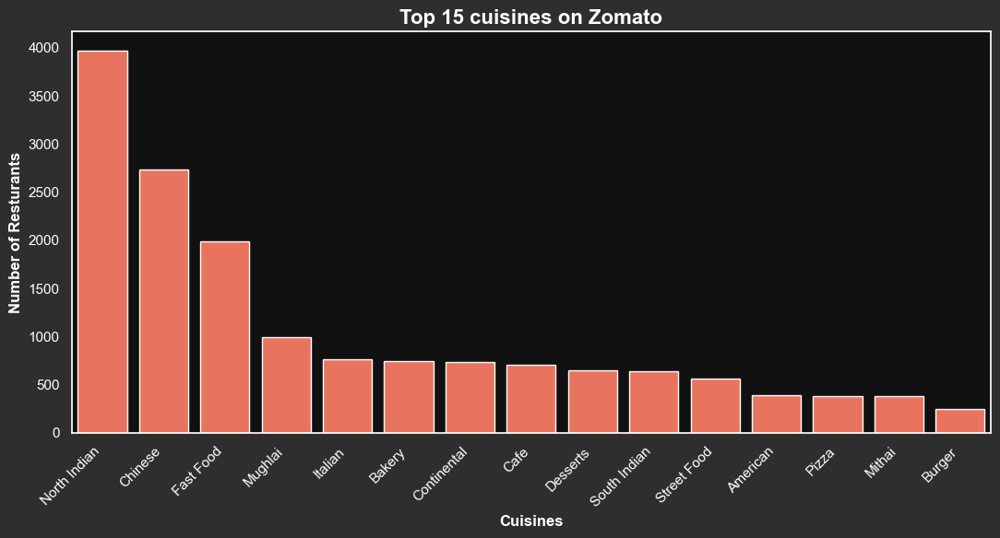

In [ ]:
df['Cuisine'] = df['Cuisines'].str.split(', ')
df_expanded = df.explode('Cuisine')

cuisine_data = df_expanded.groupby(['Cuisine'], as_index=False)['Restaurant ID'].count()
cuisine_data.columns = ['Cuisines','Number of Resturants']

Top15= (cuisine_data.sort_values(['Number of Resturants'],ascending=False)).head(15)


sns.set(rc={'figure.figsize':(11,6)})
sns.barplot(x='Cuisines', y='Number of Resturants', data=Top15, color='tomato')

plt.title('Top 15 cuisines on Zomato', fontsize=16, color='white', weight='bold')
plt.xlabel('Cuisines', color='white', weight='bold')
plt.ylabel('Number of Resturants', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()

In [21]:
Top15

,Cuisines,Number of Resturants
100,North Indian,3969
34,Chinese,2735
49,Fast Food,1986
95,Mughlai,995
70,Italian,764
13,Bakery,745
37,Continental,736
27,Cafe,703
42,Desserts,653
123,South Indian,636


#### Insight 

The most commonly offered cuisines (based on restaurant counts) are:
- North Indian
- Chinese
- Fast Food
- Mughlai
- Italian

This mix of traditional Indian (North Indian, Mughlai) and contemporary/global cuisines (Fast Food, Chinese, Bakery) shows that consumers enjoy both local authenticity and international flavors.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\1533979585.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




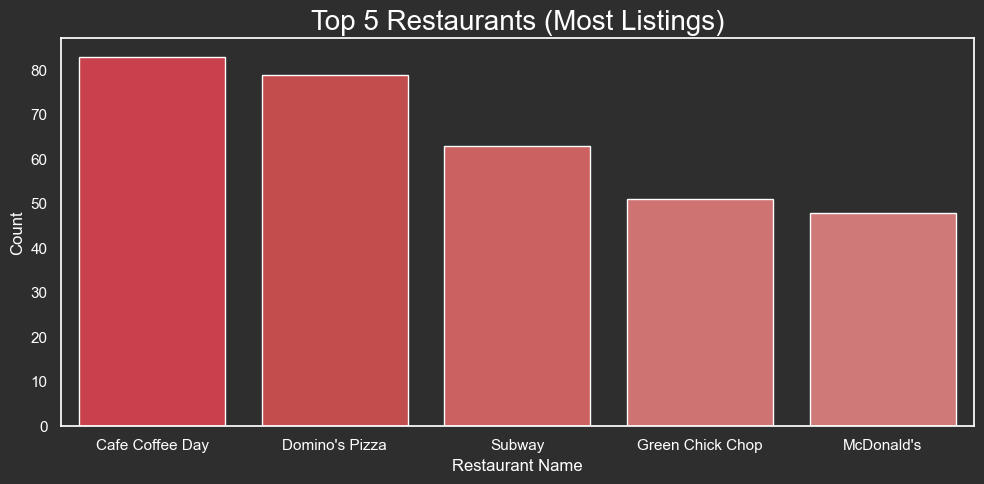

<Figure size 1100x600 with 0 Axes>

In [22]:
top5_restaurants = df['Restaurant Name'].value_counts().head(5).reset_index()
top5_restaurants.columns = ['Restaurant Name', 'Count']

# Zomato red gradient (5 shades)
colors = ["#DF2A39", "#D63939", "#DD4F4F", "#DD6363", "#DF6A6A"]

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(data=top5_restaurants, x='Restaurant Name', y='Count', palette=colors)
plt.title('Top 5 Restaurants (Most Listings)', color='white', fontsize=20)
plt.ylabel('Count', color='white')
plt.xlabel('Restaurant Name', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()
plt.tight_layout()
plt.show()

#### Insight 
Here we can see the Top 5 restaurants with the highest number of listings : These include popular chains like Café Coffee Day, Domino's, and others, indicating their widespread presence and high demand.

#### Now Lets check Resturent which have have Excellent Rating in India

In [23]:
india_df = df[df['Country'] == 'India']
india_df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,Restaurant_Count,Cuisine
624,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",...,No,No,3,3.9,Yellow,Good,140,India,8652,"[North Indian, Mughlai]"
625,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",...,No,No,2,3.5,Yellow,Good,71,India,8652,"[North Indian, Mughlai]"
626,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,...,No,No,2,3.6,Yellow,Good,94,India,8652,[North Indian]
627,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,...,No,No,2,4.0,Green,Very Good,87,India,8652,[Rajasthani]
628,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",...,No,No,3,4.2,Green,Very Good,177,India,8652,"[North Indian, Chinese, Mughlai]"


#### Exploring the dataset for Top Cities and localities

In [24]:
print(df['Rating text'])

0       Excellent
1       Excellent
2       Very Good
3       Excellent
4       Excellent
          ...    
9546    Very Good
9547    Very Good
9548         Good
9549    Very Good
9550    Very Good
Name: Rating text, Length: 9551, dtype: object


In [25]:
excellent_df = india_df[india_df['Rating text'] == 'Excellent']
excellent_df[['Restaurant Name', 'City', 'Aggregate rating', 'Votes']].head()


,Restaurant Name,City,Aggregate rating,Votes
637,Sheroes Hangout,Agra,4.9,77
646,Huber & Holly,Ahmedabad,4.5,217
653,Cryo Lab,Ahmedabad,4.6,166
660,Nini's Kitchen,Ahmedabad,4.5,1138
727,The Fatty Bao - Asian Gastro Bar,Bangalore,4.7,2369


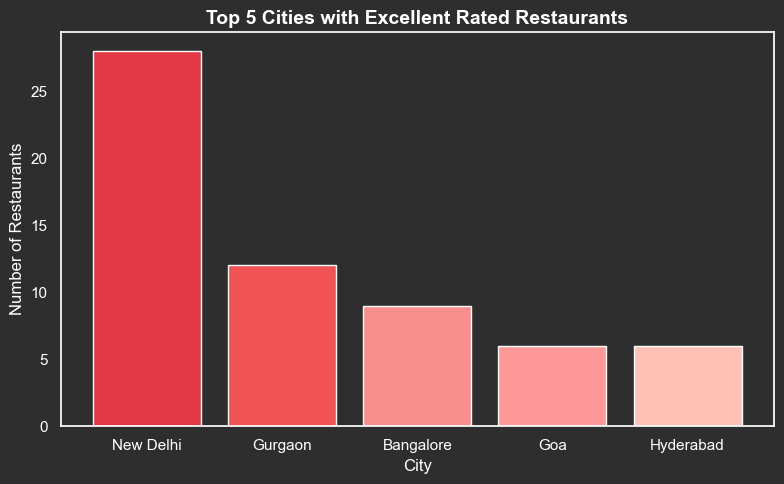

In [26]:
city_counts = excellent_df['City'].value_counts().head()
# Zomato color theme
colors = ['#E23744', '#F15354', '#F98E8E', '#FF9999', '#FFC1B6']

plt.figure(figsize=(8, 5))
plt.bar(city_counts.index, city_counts.values, color=colors)
plt.title('Top 5 Cities with Excellent Rated Restaurants', color='white', fontsize=14, weight='bold')
plt.xlabel('City', color='white')
plt.ylabel('Number of Restaurants', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()

In [27]:
city_counts = df['City'].value_counts()
city_counts

City
New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
                  ... 
Lakes Entrance       1
Mohali               1
Panchkula            1
Bandung              1
Randburg             1
Name: count, Length: 141, dtype: int64

#### Insight
From the data, we can see that:

New Delhi (5,473) and Gurgaon (1,118) have the highest number of orders, indicating strong user activity in these regions.

Noida (1,080) also shows a significant number of orders, reinforcing the dominance of the NCR (National Capital Region) in overall engagement.

Surprisingly, Bangalore has only 20 orders recorded. This is likely due to limited or incomplete data, as Bangalore is typically one of the top cities for food delivery.

Many other major cities such as Mumbai, Pune, Kolkata, Chennai, Hyderabad, and Jaipur all show only 20 orders, which further supports the assumption that this dataset may not fully represent these areas.

Overall, it's clear that New Delhi, Gurgaon, and Noida stand out in terms of order volume, while data from other major cities appears to be incomplete or underrepresented.

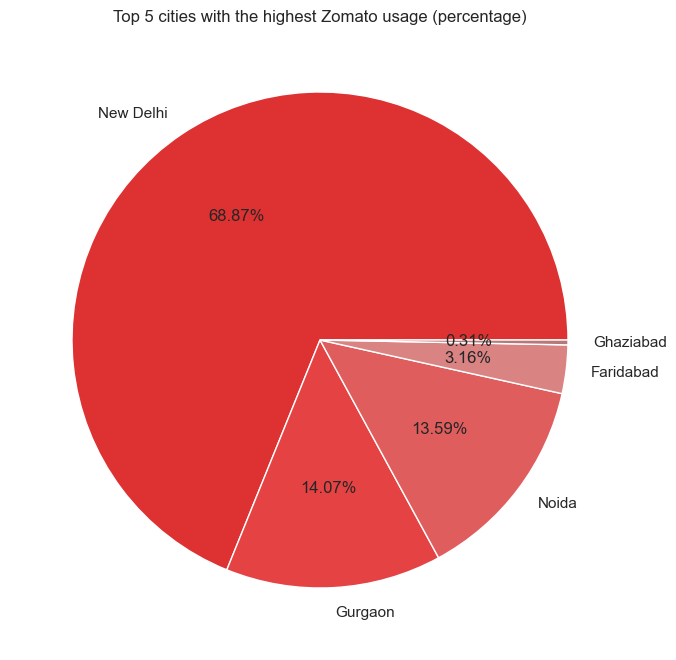

In [28]:
cities = india_df['City'].value_counts()
plt.figure(figsize=(8,10))
plt.pie(x=cities[:5], labels=cities[:5].index, autopct='%.2f%%', 
        colors=["#DE3232", "#E54343", "#E05D5D", "#DA8383","#B57979"])
plt.title('Top 5 cities with the highest Zomato usage (percentage)')
plt.show()

Top 5 cities are from India. New Delhi makes up 68.87% of it

In [29]:
Localities = df['Locality'].value_counts()
Localities[:50]

Locality
Connaught Place               122
Rajouri Garden                 99
Shahdara                       87
Defence Colony                 86
Malviya Nagar                  85
Pitampura                      85
Mayur Vihar Phase 1            84
Rajinder Nagar                 81
Safdarjung                     80
Satyaniketan                   79
Krishna Nagar                  77
Sector 62                      76
Karol Bagh                     76
Sector 18                      75
Hauz Khas                      74
Kalkaji                        73
Sector 15                      71
Mahipalpur                     69
DLF Phase 3                    69
Mukherjee Nagar                68
Chandni Chowk                  67
Shalimar Bagh                  67
Greater Kailash (GK) 1         66
Greater Kailash (GK) 2         66
Kamla Nagar                    65
Delhi University-GTB Nagar     65
Paharganj                      64
MG Road                        63
Vasundhara Enclave             62
Secto

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\85146403.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




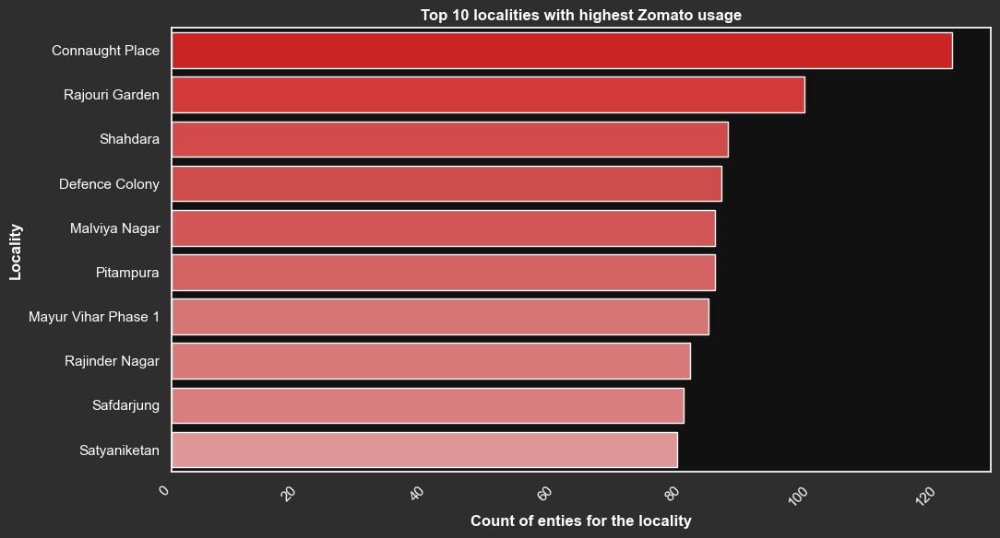

In [30]:
plt.Figure(figsize=(12,10))
sns.barplot(x=Localities[:10].values, y=Localities[:10].index, 
            palette=["#E70808", "#EB2121", "#EA3333", "#E23838","#E74141",
                     "#E85050","#E56565","#E66A6A","#E86F6F","#E98989" ])
plt.title('Top 10 localities with highest Zomato usage', color = 'white', weight='bold')
plt.xlabel('Count of enties for the locality', color='white', weight='bold')
plt.ylabel('Locality', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()

#### Insight
From the data, we can see that:

Certain localities in Delhi, like Connaught Place, Rajouri Garden, and Shahdara, show significant user activity and restaurant density. These areas are high-traffic and likely central business or residential zones.

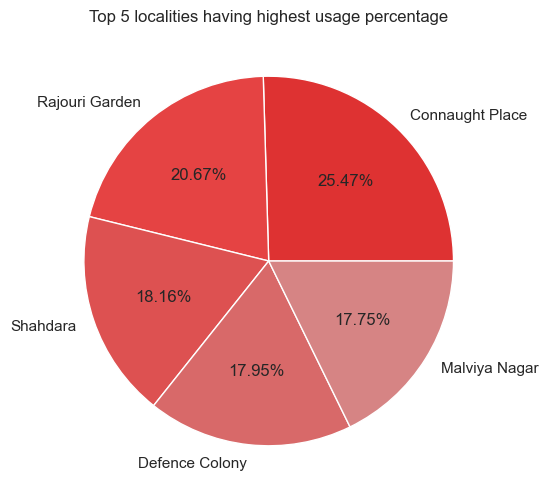

In [31]:
plt.figure(figsize=(12,6))
plt.pie(x=Localities[:5], labels=Localities[:5].index, autopct='%.2f%%', colors=["#DE3232", "#E54343", "#DD5151", "#D86969","#D68484"])
plt.title('Top 5 localities having highest usage percentage')
plt.show()

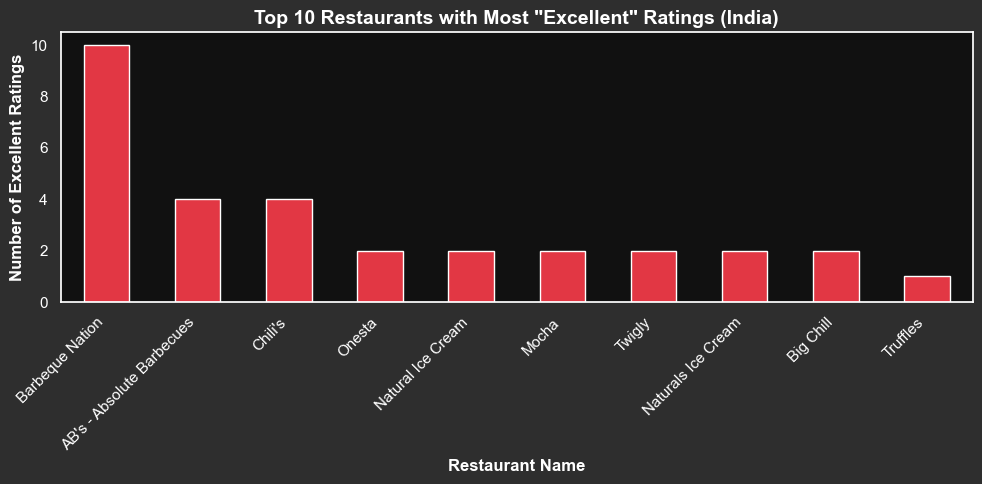

In [32]:
plt.figure(figsize=(10,5))
top_excellent_restaurants = excellent_df['Restaurant Name'].value_counts().head(10)
top_excellent_restaurants.plot(kind='bar', color= '#E23744')
plt.title('Top 10 Restaurants with Most "Excellent" Ratings (India)', color='white', fontsize=14,  weight='bold')
plt.xlabel('Restaurant Name', color='white', weight='bold')
plt.ylabel('Number of Excellent Ratings', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()

#### Insight 
The restaurants with the highest number of “Excellent” ratings include:

Barbeque Nation,Chili’s etc

Surprisingly Popular fast food brands like McDonald’s and Domino’s — despite having many outlets — do not appear in the top Excellent-rated list, suggesting customers value dine-in experiences and quality over scale.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\1866260216.py:17: UserWarning:

Glyph 140 (\x8c) missing from font(s) Arial.

c:\Users\Lenovo\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 140 (\x8c) missing from font(s) Arial.



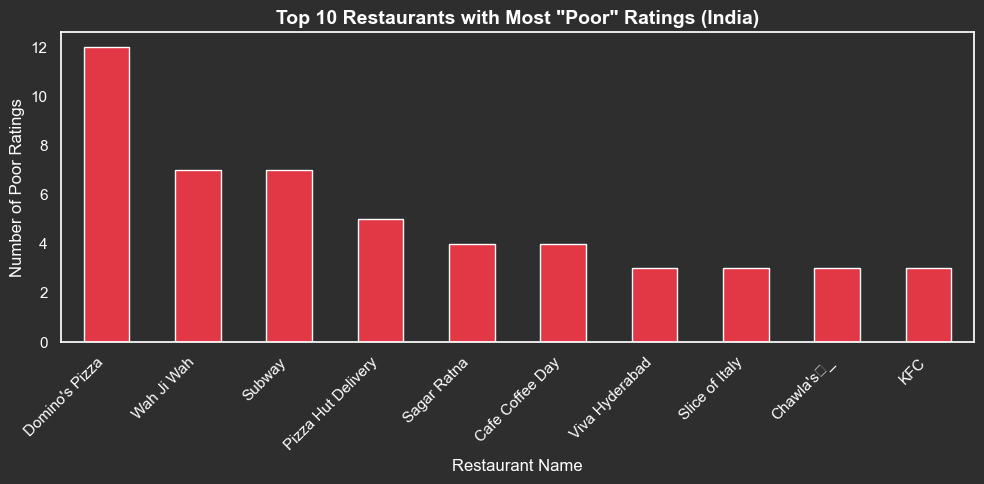

In [33]:
poor_df = india_df[india_df['Rating text'] == 'Poor']
top_poor_restaurants = poor_df['Restaurant Name'].value_counts().head(10)


plt.figure(figsize=(10, 5))
top_poor_restaurants.plot(kind='bar', color='#E23744')  # Zomato red for negative

# Styling
plt.title('Top 10 Restaurants with Most "Poor" Ratings (India)', color='white', fontsize=14, weight='bold')
plt.xlabel('Restaurant Name', color='white')
plt.ylabel('Number of Poor Ratings', color='white')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')  # Dark background
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()

#### Insight
Interestingly, several major chains top the list for poor ratings:
- Domino’s
- Subway
- KFC
- Pizza Hut
This could be due to inconsistent quality, delivery delays, or customer expectations not being met — despite their large network.

#### Price distribution 

In [34]:

india_df['Price range'].value_counts().sort_index()

Price range
1    4295
2    2858
3    1111
4     388
Name: count, dtype: int64

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\2568305895.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




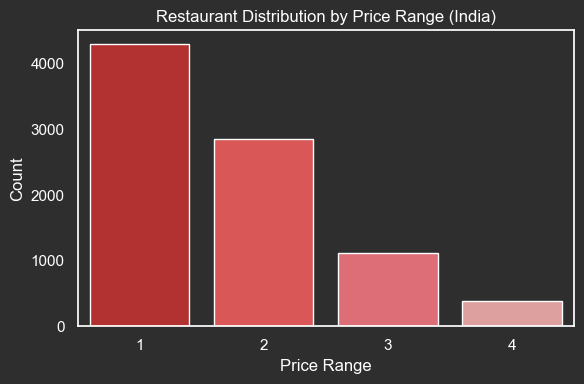

In [35]:
plt.figure(figsize=(6,4))
sns.countplot(data=india_df, x='Price range', palette=["#C71C1C", "#EF4141", "#F05B67", "#E89494"])
plt.title('Restaurant Distribution by Price Range (India)', color='white')
plt.xlabel('Price Range', color='white')
plt.ylabel('Count', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()

#### Insight 
Most restaurants are in Price Range 1 or 2, meaning they are relatively affordable.

Very few restaurants fall under Price Range 4, indicating a small luxury market.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\2858371568.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




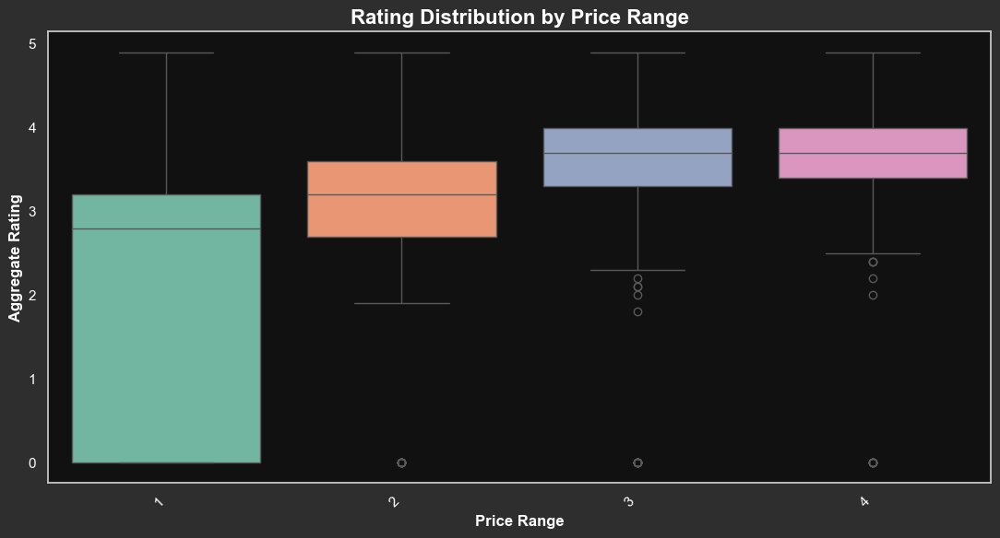

In [102]:
sns.boxplot(data=india_df, x='Price range', y='Aggregate rating', palette='Set2')
plt.title('Rating Distribution by Price Range', fontsize=16, color='white', weight='bold')
plt.xlabel('Price Range', color='white', weight='bold')
plt.ylabel('Aggregate Rating', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()

In [37]:
pd.crosstab(india_df['City'], india_df['Price range']).sort_values(by=4, ascending=False).head(5)

Price range,1,2,3,4
City,,,,
New Delhi,3052,1656,549,216
Gurgaon,453,440,158,67
Noida,565,401,93,21
Goa,0,0,7,13
Puducherry,2,4,6,8


#### Insight
Price Range Insights
The majority of restaurants fall under Price Range 1 and 2, indicating they are affordable to moderately priced.

Very few are in Price Range 4, highlighting that the premium/luxury dining market is still niche on Zomato in India.

Indian customers prefer value-for-money dining. However, there's untapped potential in the premium segment, especially in upscale or metro areas.

#### Exploring the availability of Online Delivery

In [38]:
deliver = df['Has Online delivery'].value_counts()
deliver

Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\1630954277.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




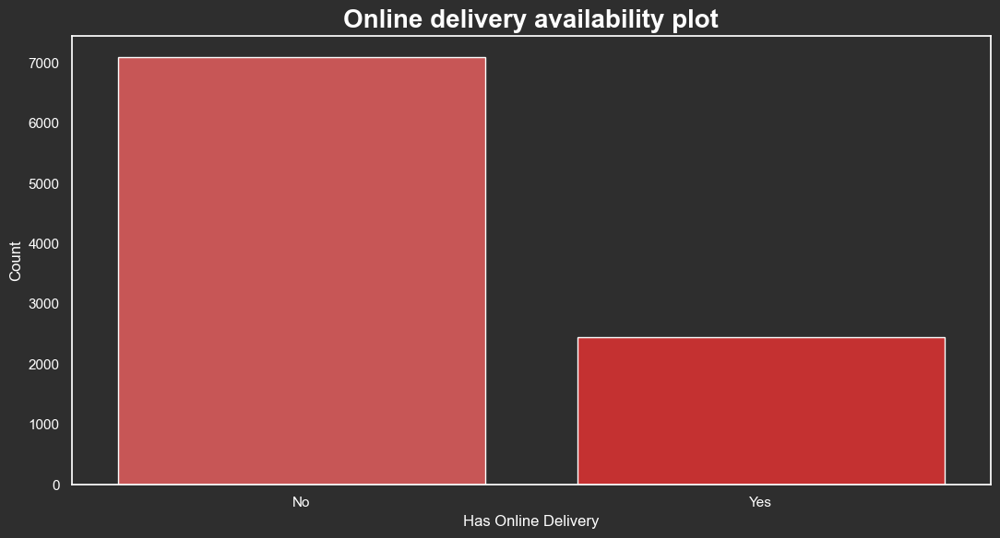

In [39]:
plt.Figure(figsize=(5,5))
sns.barplot(x=deliver.index, y=deliver.values, palette=["#DA4343","#DD1818"] )
plt.title('Online delivery availability plot', color='white', weight='bold', fontsize=20)
plt.xlabel('Has Online Delivery', color='white')
plt.ylabel('Count', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()

Most of the restaurants do not have online delivery

In [40]:
# which countries have online delivery 
country_deliver = df.groupby(['Country','Has Online delivery']).size().reset_index().rename(columns={0:'Count'})
country_deliver

,Country,Has Online delivery,Count
0,Australia,No,24
1,Brazil,No,60
2,Canada,No,4
3,India,No,6229
4,India,Yes,2423
5,Indonesia,No,21
6,New Zealand,No,40
7,Phillipines,No,22
8,Qatar,No,20
9,Singapore,No,20


We can observe that only India and UAE has some online delivery restaurants. Maximum online delivery happens in India

In [41]:
deli_city=india_df.groupby(['City', 'Has Online delivery']).size().reset_index()
deli_city

,City,Has Online delivery,0
0,Agra,No,20
1,Ahmedabad,No,10
2,Ahmedabad,Yes,11
3,Allahabad,No,20
4,Amritsar,No,21
...,...,...,...
56,Secunderabad,Yes,1
57,Surat,No,20
58,Vadodara,No,20
59,Varanasi,No,20


In [42]:
deli_city[deli_city['Has Online delivery']=='Yes'].rename(columns={0:'Count'}).sort_values(by='Count',ascending=False)

,City,Has Online delivery,Count
46,New Delhi,Yes,1489
23,Gurgaon,Yes,425
48,Noida,Yes,364
18,Faridabad,Yes,35
13,Chennai,Yes,13
2,Ahmedabad,Yes,11
43,Nagpur,Yes,10
29,Jaipur,Yes,10
20,Ghaziabad,Yes,10
34,Kolkata,Yes,8


#### Insight 
New Delhi has the highest number of online delivery 1489. Then comes Gurgoan (425) and Noida (364)

In [43]:
New_Delhi=india_df[india_df['City']=='New Delhi']

In [44]:
delivery_localities_Delhi = New_Delhi.groupby(['Locality', 'Has Online delivery']).size().reset_index().query("`Has Online delivery` == 'Yes'").sort_values(by=0,ascending=False).rename(columns={0:'Count'})
delivery_localities_Delhi

,Locality,Has Online delivery,Count
206,Malviya Nagar,Yes,64
55,Connaught Place,Yes,52
76,Defence Colony,Yes,49
295,Rajouri Garden,Yes,45
107,Greater Kailash (GK) 1,Yes,41
...,...,...,...
262,"Palate of Delhi, Chanakyapuri",Yes,1
249,Nizamuddin,Yes,1
338,Subhash Nagar,Yes,1
363,"The Village Restaurant Complex, Khel Gaon Marg",Yes,1


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\4126015418.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




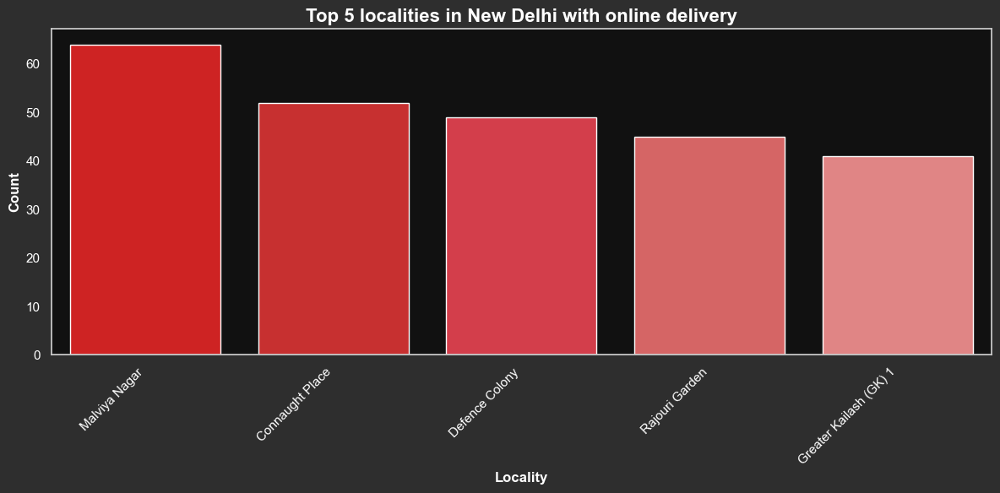

In [98]:
plt.figure(figsize=(12,6))
sns.barplot(x=delivery_localities_Delhi[:5].Locality,y=delivery_localities_Delhi[:5].Count, 
            palette=["#EB0606", "#E01717", "#EC2536", "#E85252","#EF7676"])
plt.title('Top 5 localities in New Delhi with online delivery', fontsize=16, color='white', weight='bold')
plt.xlabel('Locality', color='white', weight='bold')
plt.ylabel('Count', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()

Malviya Nagar has the highest number of online delivery followed by CP and Defence Colony

#### Exploring Average cost for two people in different currencies

In [46]:
avg_cost = df['Average Cost for two']
avg_cost.describe()

count      9551.000000
mean       1199.210763
std       16121.183073
min           0.000000
25%         250.000000
50%         400.000000
75%         700.000000
max      800000.000000
Name: Average Cost for two, dtype: float64

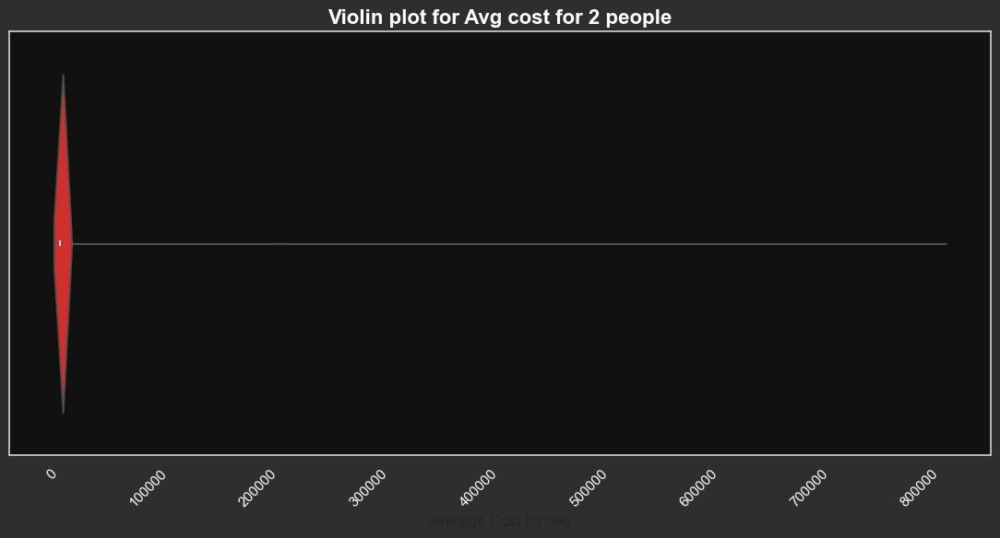

In [101]:
sns.violinplot(x=df['Average Cost for two'], color="#ED1410")
plt.title('')

plt.title('Violin plot for Avg cost for 2 people', fontsize=16, color='white', weight='bold')

plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()

75% of the data lies below 700. Therefore the data is highly right skewed. A small number of very expensive restaurants are increasing the avg.

#### Exploring Price, Ratings and Votes

In [50]:
Correlation_matrix=df[['Average Cost for two','Price range', 'Aggregate rating','Votes']].corr()
Correlation_matrix

,Average Cost for two,Price range,Aggregate rating,Votes
Average Cost for two,1.000000,0.075083,0.051792,0.067783
Price range,0.075083,1.000000,0.437944,0.309444
Aggregate rating,0.051792,0.437944,1.000000,0.313691
Votes,0.067783,0.309444,0.313691,1.000000


<Axes: >

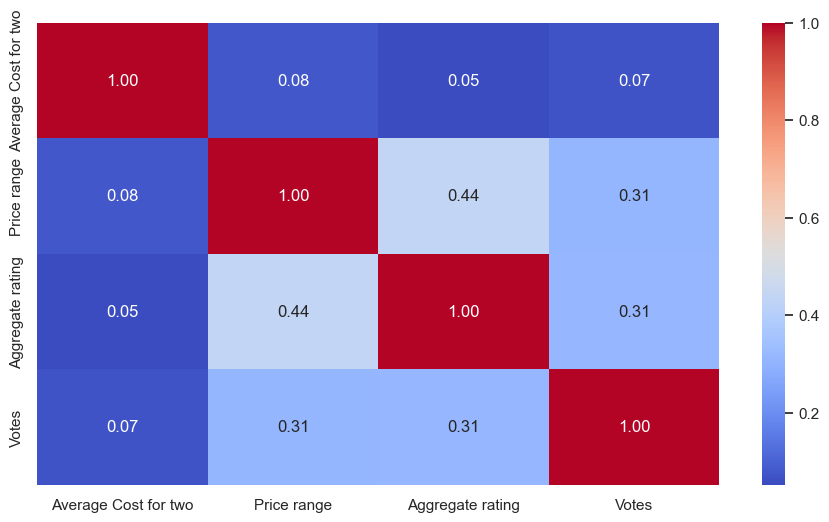

In [51]:
sns.heatmap(Correlation_matrix, cmap='coolwarm', fmt='.2f', annot=True)

#### Insight 
We can see that there is very less correlation between the columns Price range, aggregate rating and votes. This means price alone doesn’t determine how well a restaurant is rated or how many votes it gets.

In [52]:
Votes_cost= df[['Price range', 'Aggregate rating','Votes']]
Votes_cost

,Price range,Aggregate rating,Votes
0,3,4.8,314
1,3,4.5,591
2,4,4.4,270
3,4,4.9,365
4,4,4.8,229
...,...,...,...
9546,3,4.1,788
9547,3,4.2,1034
9548,4,3.7,661
9549,4,4.0,901


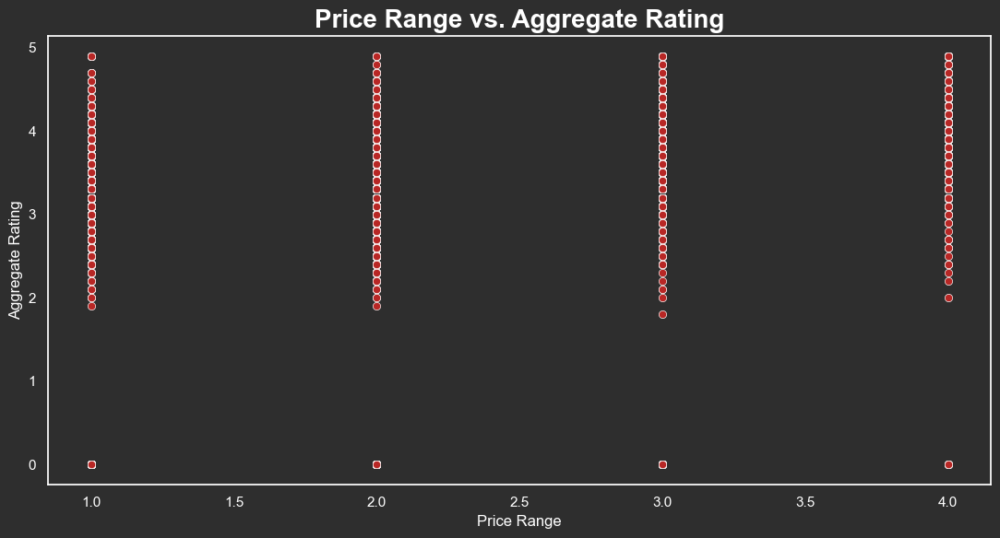

In [ ]:
sns.scatterplot(x=Votes_cost['Price range'], y=Votes_cost['Aggregate rating'], color="#B82525")
plt.title('Price Range vs. Aggregate Rating', color='white', weight='bold', fontsize=20)
plt.xlabel('Price Range', color='white')
plt.ylabel('Aggregate Rating', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()

#### Insight 
The spread of ratings looks fairly uniform across all price ranges. There’s no visible trend where increasing price leads to higher ratings — indicating other factors like food quality, service, ambiance, or location likely play a larger role.

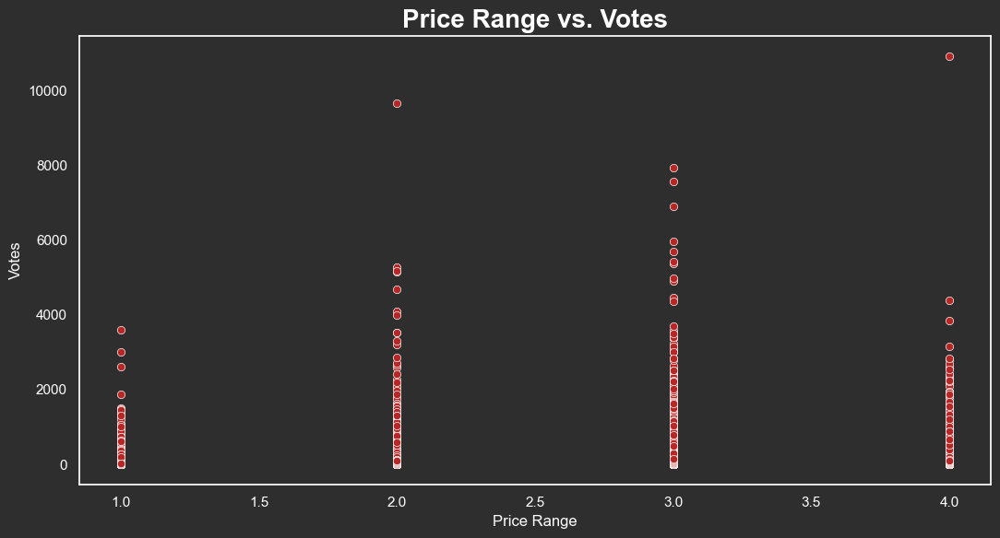

In [54]:
sns.scatterplot(x=Votes_cost['Price range'], y=Votes_cost['Votes'], color="#B82725")
plt.title('Price Range vs. Votes', color='white', weight='bold', fontsize=20)
plt.xlabel('Price Range', color='white')
plt.ylabel('Votes', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()

#### Insight
The most affordable restaurants (Price range 1 and 2) have a few with very high vote counts, meaning affordability doesn’t prevent popularity — it may just be less common.

While both Price Range 3 and 4 have high-vote restaurants, Price 3 seems to have more overall engagement (more red dots higher up), suggesting it may be the sweet spot for popularity and affordability.

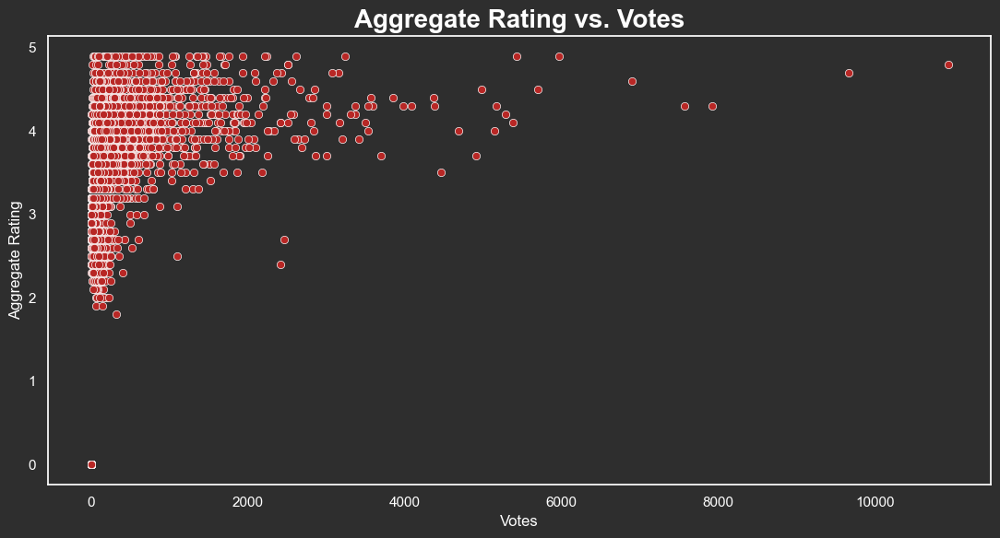

In [55]:
sns.scatterplot(y=Votes_cost['Aggregate rating'], x=Votes_cost['Votes'], color="#B82725")
plt.title('Aggregate Rating vs. Votes', color='white', weight='bold', fontsize=20)
plt.xlabel('Votes', color='white')
plt.ylabel('Aggregate Rating', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('#2E2E2E')
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.grid(False)
plt.tight_layout()
plt.show()

#### Insight 
There is a visible upward concentration of data points between ratings 4.0 to 5.0 for restaurants with higher vote counts. This suggests that more popular restaurants tend to receive better ratings, likely due to better food, service, or marketing.

Restaurants with ratings below 3.0 generally have very low votes, indicating they are less known or less visited.

Most data points with over 1000+ votes cluster around ratings above 4, reinforcing the trust that high-engagement restaurants generally have strong customer approval

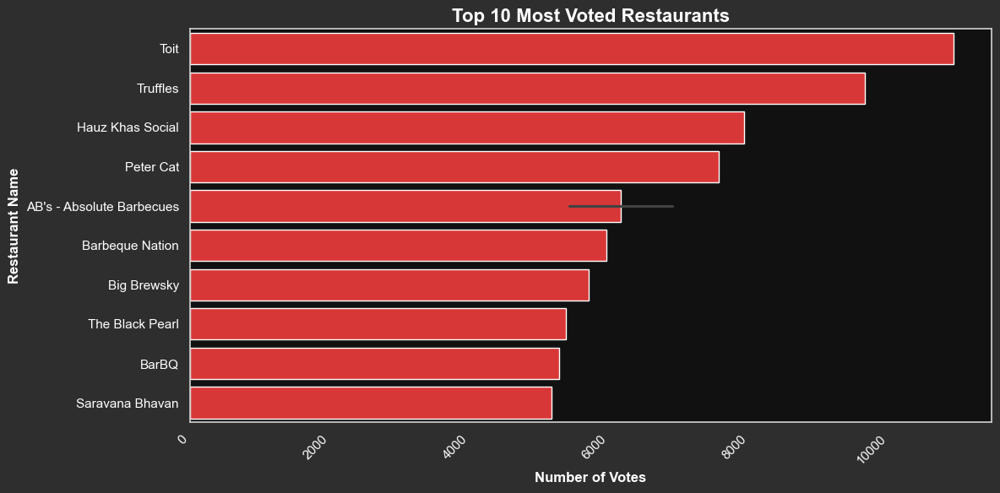

In [80]:
top_voted = df[['Restaurant Name', 'Votes']].sort_values(by='Votes', ascending=False).head(11)
plt.figure(figsize=(12, 6))
sns.barplot(x='Votes', y='Restaurant Name', data=top_voted, color="#F31C1C")

plt.title('Top 10 Most Voted Restaurants', fontsize=16, color='white', weight='bold')
plt.xlabel('Number of Votes', color='white', weight='bold')
plt.ylabel('Restaurant Name', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()


In [76]:
top_voted = df[['Restaurant Name', 'Votes']].sort_values(by='Votes', ascending=False)
top_voted

,Restaurant Name,Votes
728,Toit,10934
735,Truffles,9667
3994,Hauz Khas Social,7931
2412,Peter Cat,7574
739,AB's - Absolute Barbecues,6907
...,...,...
5732,Daily Belly,0
5733,Deep Bakery And Cake,0
5734,Dhaba NH10,0
5735,Dilkhush Dhaba,0


#### Insight 
Restaurants like Toit (10,934 votes), Truffles, and Peter Cat stand out for customer engagement, suggesting a loyal or large customer base.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\2697878605.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




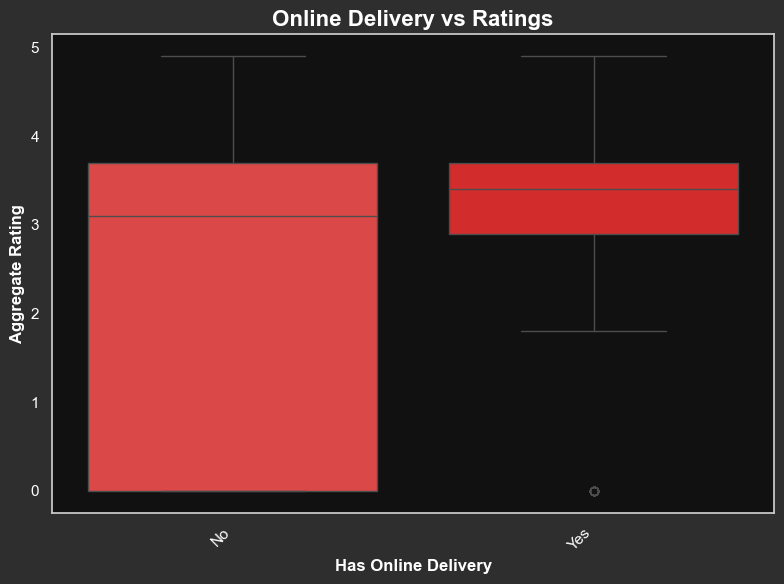

In [95]:
plt.figure(figsize=(8,6))

sns.boxplot(x='Has Online delivery', y='Aggregate rating', data=df, palette=["#F42F2F", "#EF1010"])
plt.title('Online Delivery vs Ratings', fontsize=16, color='white', weight='bold')
plt.xlabel('Has Online Delivery', color='white', weight='bold')
plt.ylabel('Aggregate Rating', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()


| Feature                | `No` (No online delivery)       | `Yes` (Online delivery available) |
| ---------------------- | ------------------------------- | --------------------------------- |
| **Median Rating**      | \~3.1                           | \~3.4                             |
| **Spread (IQR)**       | Wider range                     | Tighter range                     |
| **Outliers**           | None noticeable                 | One low outlier near 0            |
| **Rating Range**       | Mostly from 2.5 to 4.5          | Mostly from 3.0 to 4.5            |
| **Whiskers (min–max)** | Broad range (likely 0 to \~4.9) | Slightly tighter (\~1.8 to \~4.9) |


#### Insight Online Delivery vs Rating
From the boxplot analysis, we observe that restaurants offering online delivery have a slightly higher median rating compared to those that don't.

The median rating for delivery-enabled restaurants is around 3.4, versus 3.1 for those without it.

The range of ratings is narrower for delivery-enabled restaurants, suggesting more consistency in quality.

A few outliers exist (e.g., very low-rated delivery restaurants), but overall, online delivery is associated with better ratings.
- Enabling online delivery may contribute to higher customer satisfaction or attract better-rated restaurants.
This could be a valuable feature to prioritize in product decisions or marketing strategy.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12220\296897532.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




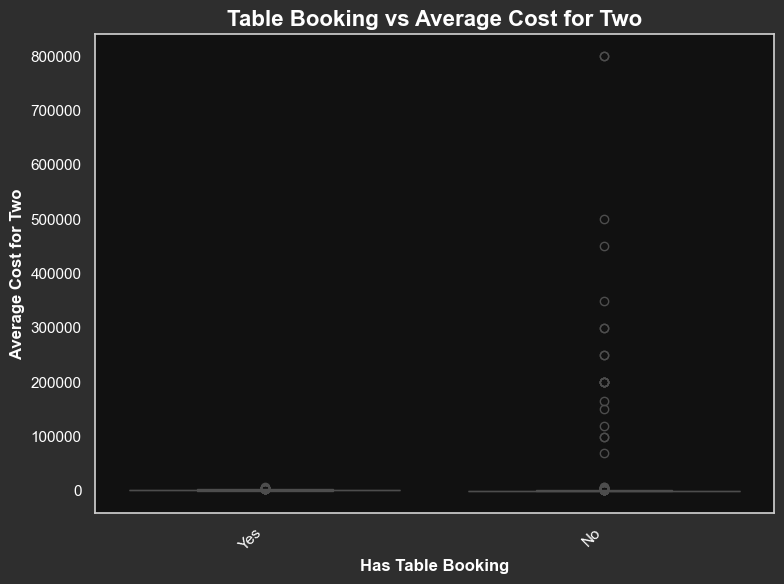

In [96]:
plt.figure(figsize=(8,6))

sns.boxplot(x='Has Table booking', y='Average Cost for two', data=df,  palette=["#F42F2F", "#EF1010"])
plt.title('Table Booking vs Average Cost for Two', fontsize=16, color='white', weight='bold')
plt.xlabel('Has Table Booking', color='white', weight='bold')
plt.ylabel('Average Cost for Two', color='white', weight='bold')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.gca().set_facecolor("#111111")
plt.gcf().patch.set_facecolor('#2E2E2E')
plt.tight_layout()
plt.grid(False)
plt.show()

#### Insight
Restaurants that offer table booking generally maintain a consistent pricing structure. This suggests that more premium or formal dining setups manage their cost expectations better.
On the other hand, restaurants without table booking have a wider range of average costs, including several very high-cost outliers. This could either indicate elite restaurants that rely on walk-ins or possible data inconsistencies (e.g., incorrect price entries).

## Final Conclusion:

This Zomato dataset provides strong evidence that:

Zomato’s operations are deeply rooted in India, with the NCR region being its strongest base.

Consumers prefer a mix of traditional Indian and popular global cuisines.

High ratings and popularity do not always correlate with high prices.

Online delivery and table booking are features that associate with consistency and customer satisfaction.

City-wise distribution shows opportunities to expand online services in Tier-2 cities.

In terms of service availability, only 2,451 restaurants offer online delivery, highlighting that a large number of establishments still rely on dine-in or takeaway options rather than digital platforms. These findings provide valuable insights into restaurant trends, customer behavior, and areas where improvements, such as enhancing online delivery services or encouraging more customer feedback, could benefit businesses.